<a href="https://colab.research.google.com/github/onyekaokonji/Selective_Segmentation/blob/main/Selective_Search.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
# Imports
import tensorflow
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
from tensorflow.image import non_max_suppression
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications.resnet50 import decode_predictions
from tensorflow.keras.preprocessing.image import img_to_array
from google.colab.patches import cv2_imshow

In [2]:
def selective_search(img, method = 'fast'):
  # initializing OpenCV selective search 
  ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

  # push the image to the algorithm
  ss.setBaseImage(img)

  # choosing the mode of the selective search - fast means higher speed but trade-off with accuracy,
  # quality means lower speed but higher accuracy
  if method == 'fast':
    ss.switchToSelectiveSearchFast()
  else:
    ss.switchToSelectiveSearchQuality()

  # obtain bounding box rectangles based on selective search segmentation
  rects = ss.process()

  return rects

In [3]:
# Instantiating model and loading sample image

#loading ResNet50 architecture
model = ResNet50(weights = 'imagenet')

# loading sample image using OpenCV
img = cv2.imread('working.jpeg')
img_height, img_width = img.shape[:2]

102981632/102967424 [==============================] - 1s 0us/step


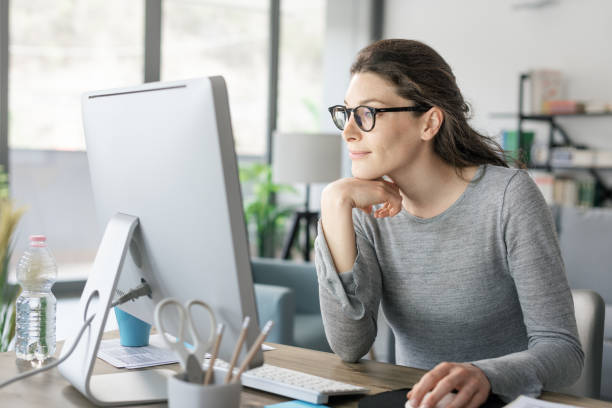

In [4]:
cv2_imshow(img)

In [5]:
# obtaining selective search bounding boxes
rects = selective_search(img, method = 'quality')

In [6]:
# initialize region proposals and bounding boxes
proposals = []
boxes = []

# looping through all the returned rectangles
for (x,y,w,h) in rects:
  
  # for boxes with dimensions less than 10% the size of the image, we skip
  if w/float(img_width) < 0.1 or h/float(img_height) < 0.1:
    continue

  # extracting roi from image using dimensions obtained from selective search
  roi = img[y:y+h, x:x+w]
  roi = cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)
  roi = cv2.resize(roi, (224, 224))

  #preprocessing ROIs
  roi = img_to_array(roi)
  roi = preprocess_input(roi)

  # append roi and box dimensions to list provided above
  proposals.append(roi)
  boxes.append((x,y,w,h))

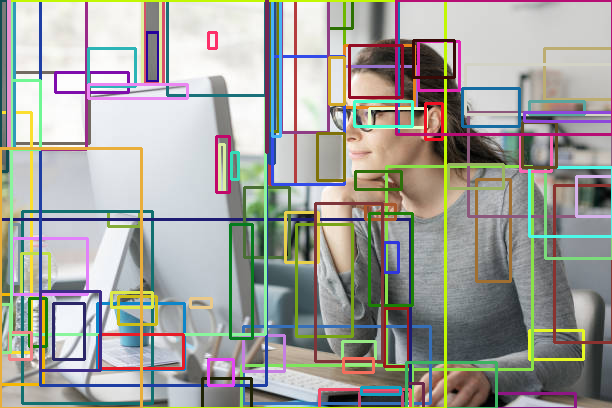

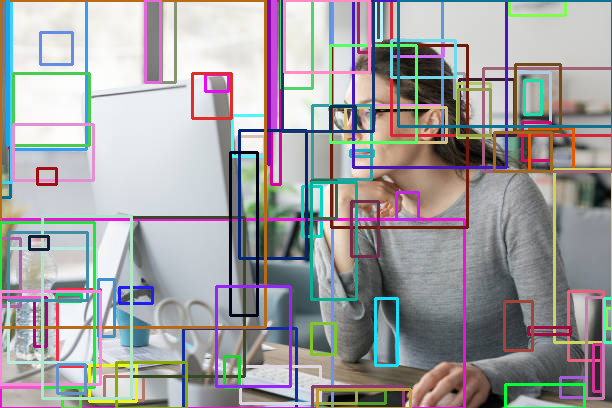

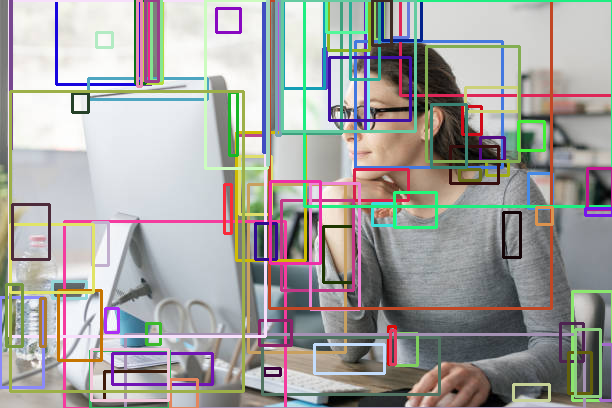

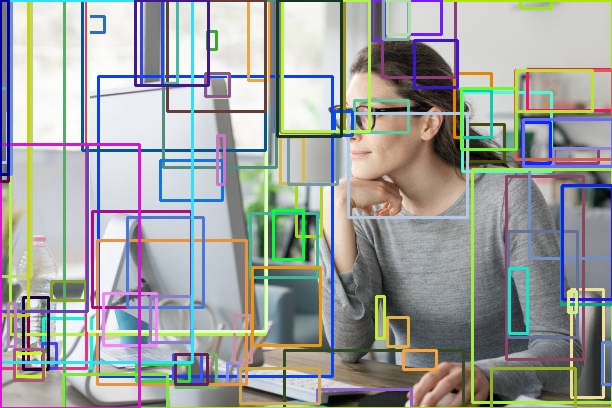

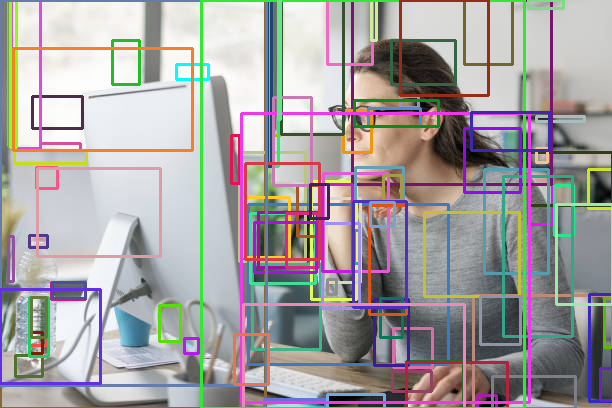

...

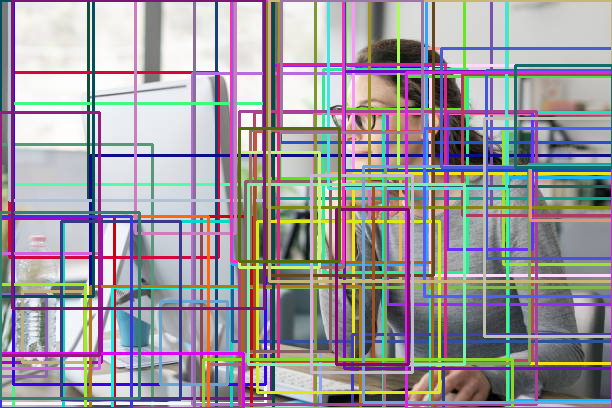

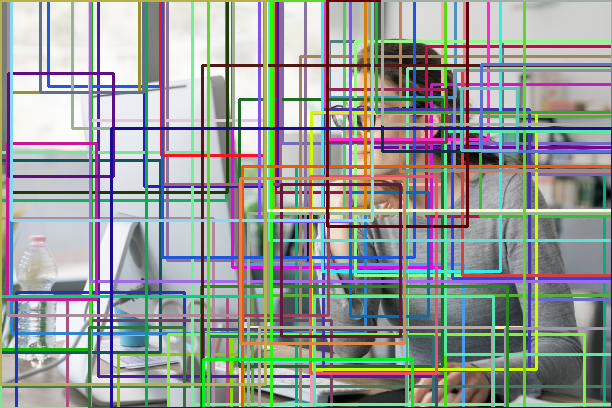

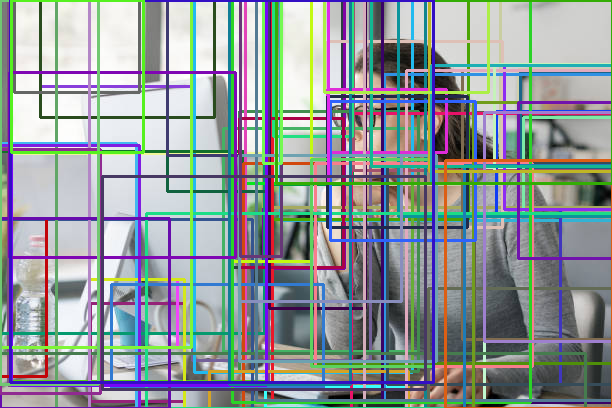

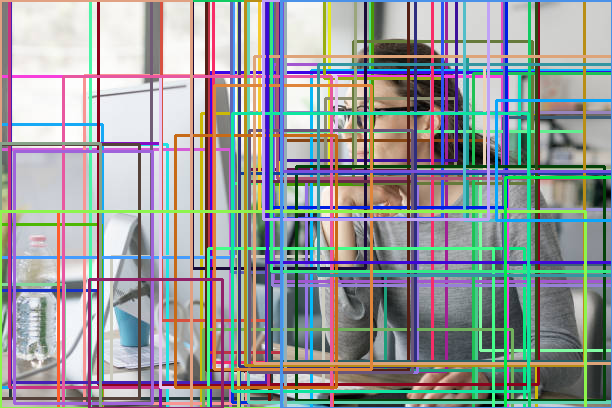

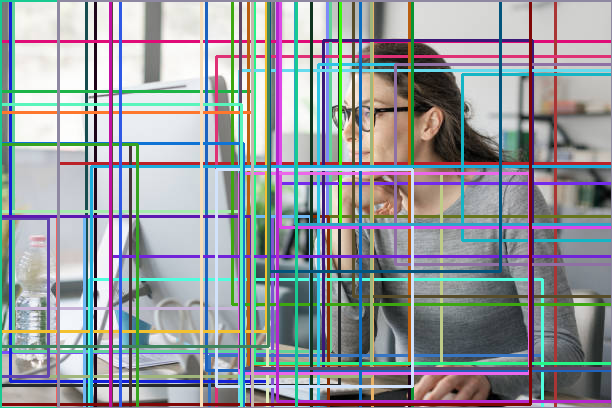

In [7]:
# viewing bounding boxes detected by selective search

for i in range(0, len(rects), 100):
  
  # clone the original image so we can draw on it
  output = img.copy()
  
  # loop over the current subset of region proposals
  for (x, y, w, h) in rects[i: i + 100]:
    # draw the region proposal bounding box on the image
    color = [random.randint(0, 255) for j in range(0, 3)]
    cv2.rectangle(output, (x, y), (x + w, y + h), color, 2)
    
  # show the output image
  cv2_imshow(output)

In [8]:
# passing proposals to TF Model

# first we convert proposals to numpy array
proposals = np.array(proposals)

preds = model.predict(proposals)

# decoding predictions
preds = decode_predictions(preds, top = 1)

49152/35363 [=========================================] - 0s 0us/step


In [9]:
# viewing predictions above 70% confidence

for i in preds:
  for j in i:
    if j[2] > 0.7:
      print(j)

('n03041632', 'cleaver', 0.8114609)
('n04591157', 'Windsor_tie', 0.7371638)
('n04270147', 'spatula', 0.9880613)
('n03825788', 'nipple', 0.78401816)
('n03832673', 'notebook', 0.7562662)
('n04270147', 'spatula', 0.75902236)
('n04270147', 'spatula', 0.9787785)
('n03404251', 'fur_coat', 0.74053365)
('n03832673', 'notebook', 0.85148615)
('n03832673', 'notebook', 0.8167426)
('n03832673', 'notebook', 0.8115253)
('n04270147', 'spatula', 0.7987682)
('n04554684', 'washer', 0.7713686)
('n03041632', 'cleaver', 0.7078294)
('n03920288', 'Petri_dish', 0.77393234)
('n04270147', 'spatula', 0.95622104)
('n04591157', 'Windsor_tie', 0.8319941)
('n03832673', 'notebook', 0.803727)
('n03832673', 'notebook', 0.7677093)
('n04355933', 'sunglass', 0.8166255)
('n03825788', 'nipple', 0.8842239)
('n04591157', 'Windsor_tie', 0.7431049)
('n03992509', "potter's_wheel", 0.7103535)
('n04591157', 'Windsor_tie', 0.7684899)
('n03832673', 'notebook', 0.85932624)
('n03584829', 'iron', 0.809026)
('n04591157', 'Windsor_tie', 0

In [10]:
confidence = 0.97

# instantiate the output labels dictionary
labels = {}

# obtain a dictionary of scores and bounding boxes
for (i, j) in enumerate(preds):

  (class_id, class_label, class_score) = j[0]

  if class_score >= confidence:
    # extract the bounding box for that prediction
    (x, y, w, h) = boxes[i]
    box = (y, x, y + h, x + w)

    L = labels.get(class_label, [])
    L.append((box, class_score))
    labels[class_label] = L

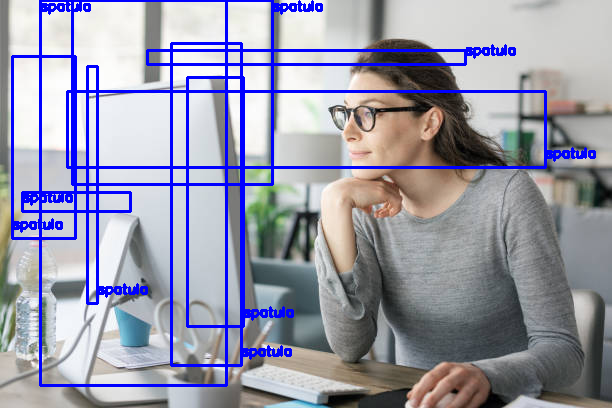

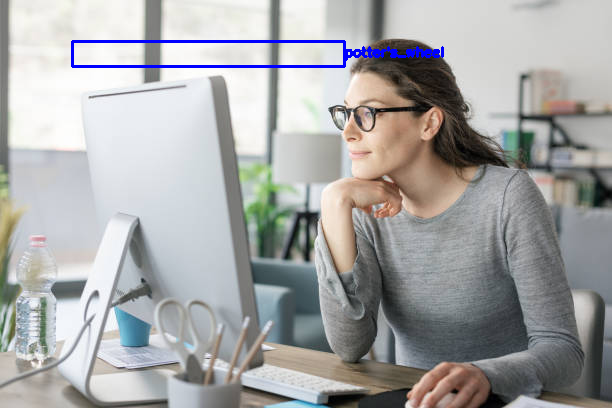

In [11]:
# extract the boxes and their scores which will be used to draw b-boxes on image

for class_label in labels.keys():
  
  img_copy = img.copy()

  box = np.array([b[0] for b in labels[class_label]])
  scores = np.array([b[1] for b in labels[class_label]])

  selected_indices = non_max_suppression(boxes = box, scores = scores, max_output_size = 50, score_threshold = confidence, iou_threshold = 0.8)
  
  selected_boxes = tf.gather(boxes, selected_indices)

  for (startX, startY, endX, endY) in selected_boxes:
    # draw the bounding box and label on the image
    cv2.rectangle(img_copy, (startX, startY), (endX, endY), (255, 0, 0), 2)
  
    y = startY - 10 if startY - 10 > 10 else startY + 10
    cv2.putText(img_copy, class_label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.45, (255, 0, 0), 2)

	# show the output after apply non-maxima suppression
  cv2_imshow(img_copy)